In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

from numpy import linalg as LA

from mpl_toolkits.axes_grid1 import make_axes_locatable

# to display directly in the notebook
%matplotlib inline 

In [2]:
plt.rcParams['figure.figsize'] = [15.0, 15.0]

# TP 2 - Estimation de densité, K plus proches voisins

**POI de Paris - **  Les POIs de Paris ont été récoltés sur l’API de google map. Le dictionnaire ainsi chargé contient différentes clés correspondant aux différents types de POIs. Chaque clé est associé à un autre dictionnaire, contenant lui les informations pour chaque POI : la clé est une valeur de hashing sans intérêt, la valeur est une liste contenant : un couple (longitude,latitude) géolocalisant le POI, la note (entre 0 et 5) attribuée par les utilisateurs, le nom du POI, la liste des types de POIs associés, et le niveau des prix (rarement disponible).

**Vélibs - **  L’archive contient 4 semaines de logs de 1217 stations velib de Paris à partir du 1 octobre 2016 et des informations sur les stations. Les objets suivants sont stockés dans l’archive :
* `stations` : un dictionnaire où chaque clé correspond à un identifiant station velib idvelib et chaque valeur à un n-uplet : (nom station, adresse station, x,y, nombre d’attaches, longitude, latitude) ; (x,y) correspond à une localisation normalisée entre 0 et 1 ; le nombre d’attaches correspond au nombre maximal
* `histo` : une matrice de taille 1217×43200, chaque ligne correspond à une station, chaque colonne au nombre de vélos disponible par minute pour la station correspondante ;
* `stations_idx` : correspondance entre le idvelib et l’indice de la ligne de la matrice correspondante ;
* `idx_stations` : correspondance entre la ligne de la matrice et le idvelib


## 1 Estimation de densité

L’objectif de cette partie est d’estimer la densité spatiale d’un certain type de POI sur le territoire parisien, notée $p_s(x, y)$ avec $(x, y)$ la longitude et latitude. Vous allez pour cela étudier deux méthodes, la méthode des histogrammes et les fenêtres de Parzen.

### 1.1 Histogramme

Soit un échantillon $ \Phi = \{x^1, ... , x^n\} ⊂ R^d $, l’objectif de la méthode des histogrammes est de
calculer une densité constante par morceaux $p(x)$ sur $R^d$ reflétant la répartition de l’échantillon. Pour
cela, une discrétisation de l’espace en hypercube est considérée et la densité est estimée à partir du
comptage du nombre d’exemples tombant dans chaque hypercube rapporté au nombre total d’exemples
multipié par le volulme de l’hypercube. Il est possible de pondérer les exemples par un poids $w^i \in R^+$
(quel serait l’intérêt ?). Pour une partition $\{Ci\}_{i=1}^{N}$ de l’espace, la densité estimée pour un point $x$ de la partition $C_{i_x}$ est $$ p(x) = \frac{\sum_{i=1}^{n}w^i 1_{x^i\in C_{i_x}}}{V_{C_{i_x}} \sum_{i=1}^{n}w^i}$$
avec $V_{C_{i_x}}$ le volume de la partition.

#### Q 1.1

In [3]:
#### Carte de Paris
parismap = mpimg.imread('paris-48.806-2.23--48.916-2.48.jpg')
## coordonnees GPS de la carte
xmin,xmax = 2.23,2.48   ## coord_x min et max
ymin,ymax = 48.806,48.916 ## coord_y min et max
def show_map():
    plt.imshow(parismap,extent=[xmin,xmax,ymin,ymax],aspect=1.5)
    ## extent pour controler l'echelle du plan
    

#### Traitement des donnes POIs google map ######
poidata = pickle.load(open("poi-paris.pkl","rb"))

## liste des types de point of interest (poi)
list_poi  = list(poidata.keys())

#print("Liste des types de POI : " , ", ".join(list_poi))

print("Liste des types de POI : ")
for i in range(len(list_poi)):
    print('\n', i, '-', list_poi[i])
    
def get_geo_poi(typ):        
    ## Creation de la matrice des coordonnees des POI
    poi_mat = np.zeros((len(poidata[typ]),2))
    for i,(k,v) in enumerate(poidata[typ].items()):
        poi_mat[i,:]=list(reversed(v[0]))
    return poi_mat

Liste des types de POI : 

 0 - furniture_store

 1 - laundry

 2 - bakery

 3 - cafe

 4 - home_goods_store

 5 - clothing_store

 6 - atm

 7 - lodging

 8 - night_club

 9 - convenience_store

 10 - restaurant

 11 - bar


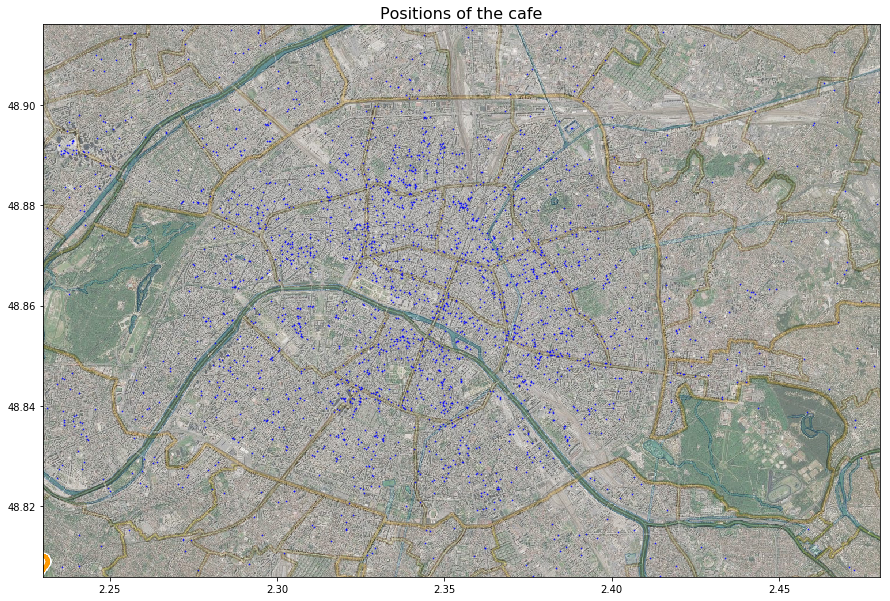

In [4]:
def question11 (number=3): # 3 - cafe
    ## Choix d'un poi
    typepoi = list_poi[number]  

    ## Affichage brut des poi
    show_map()

    ## alpha permet de regler la transparence, s la taille, color la couleur
    geo = get_geo_poi(typepoi)
    plt.scatter(geo[:,0],geo[:,1],alpha=0.8,s=0.5,color="blue")
    plt.title('Positions of the '+ typepoi, fontsize = 16)
    plt.show()
    
    return geo,typepoi
    
geo, typepoi = question11 ()

#### Q 1.2

In [5]:
def indic_numb_x (x_data, weights, cellule): # cellule = [X_min, X_max, Y_min, Y_max]
    
    # création d'un ensemble de points dans la cellule
    nombre_de_xij = np.array([weights[i]*x_data[i,:] for i in range(x_data.shape[0]) \
                            if (x_data[i,0]>=cellule[0])and(x_data[i,0]<cellule[1]) \
                                   and (x_data[i,1]>=cellule[2])and(x_data[i,1]<cellule[3])])
    
    return nombre_de_xij.shape[0]

In [6]:
def hist_map (X_data, weights, grille = [10, 10]) : ## Par défault grille C_xi = (10,10) est homogène
    
    '''
    ## coordonnees GPS de la carte
    xmin,xmax = 2.23,2.48   ## coord_x min et max
    ymin,ymax = 48.806,48.916 ## coord_y min et max
    '''
    
    h_x = (xmax - xmin)/grille[0]
    h_y = (ymax - ymin)/grille[1]
    
    V_cxi = h_x*h_y
    
    C_xi = np.arange(xmin, xmax+h_x, h_x)
    C_yi = np.arange(ymin, ymax+h_y, h_y)
    
    result = np.zeros(grille)
    
    for i in range(grille[0]):
        for j in range(grille[1]):
            cellule = [C_xi[i], C_xi[i+1], C_yi[j], C_yi[j+1]] 
            result[i,j] = indic_numb_x(X_data, weights, cellule)/(V_cxi*sum(weights)) ##
        
    return result

#afficher le resultat d'un histogramme : 
def question12(X_data, grille = [10, 10]):
    
    weights = np.ones(X_data.shape[0])
    #weights = np.random.randn(X_data.shape[0])
    
    #resultat = np.random.randn(10,10)
    resultat = hist_map (X_data, weights, grille = grille).T
    
    plt.figure()
    
    plt.title('Histogramme of the positions of the {}, grid : {}'.format(typepoi, grille), fontsize = 16)
    show_map()
    plt.imshow(resultat,extent=[xmin,xmax,ymin,ymax],interpolation='none',alpha=0.3,origin = "lower")
    
    # qmelioration de colorbar
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)  
    plt.colorbar(cax=cax)
    
    ax.scatter(X_data[:,0],X_data[:,1],alpha=0.8,s=0.35,color="blue")
    
    plt.show()

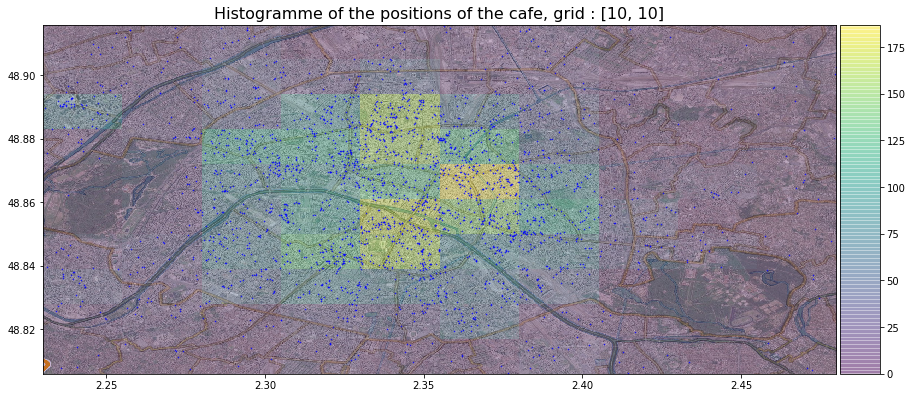

In [7]:
question12 (geo, [10,10])

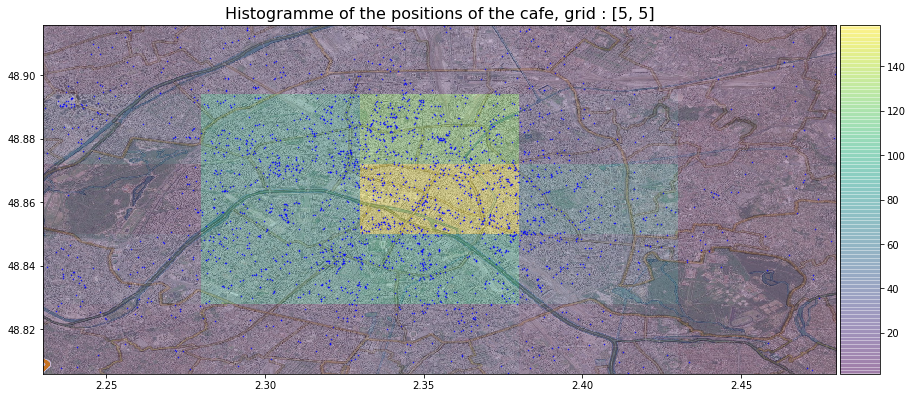

In [8]:
question12 (geo, [5,5])

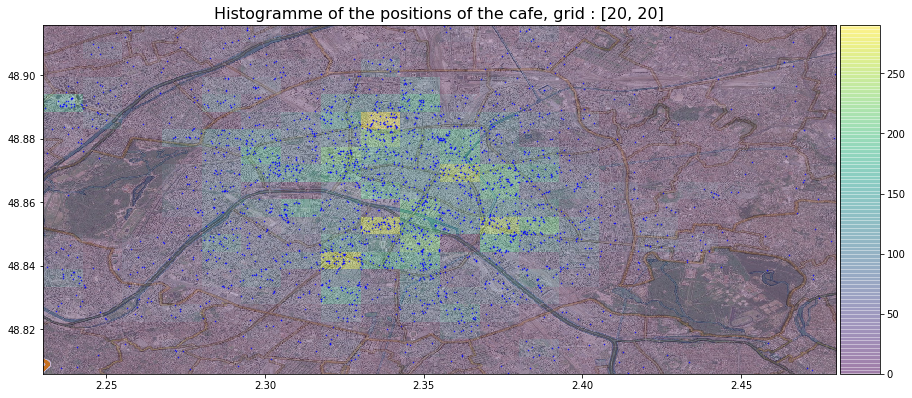

In [9]:
question12 (geo, [20,20])

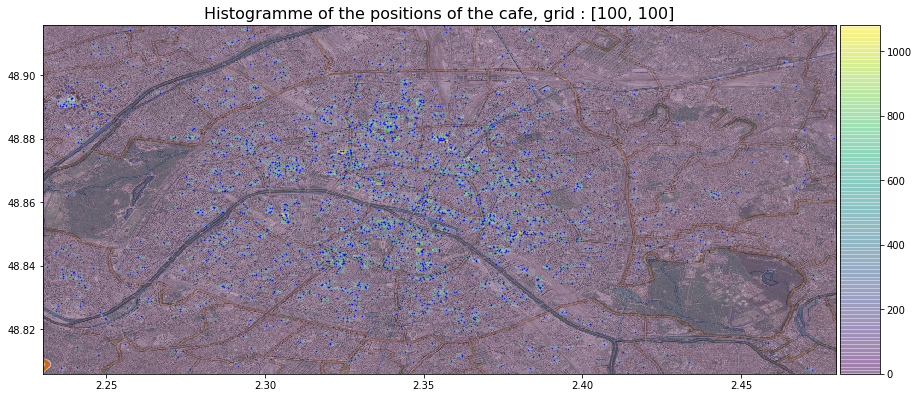

In [10]:
question12 (geo, [100,100])

#### Q 1.3 ( en anglais )

We can see that the histograms show pretty good the density of the POI. And when we use smaller discretisation we distinguish the regions with different densities more precisely. The histogram method represents one of the non-parametric methods for density estimations because we construct the estimation using only the data without some assumptions about their distibution, which can use parameters.  

But nevertheless it is difficult to find the optimal grid size in order to adapt well to both high and low density regions. And also we need to evaluate the density in each partition element, the number of which grows exponentially with the number of dimensions $d$. If one decrease the step-size by $n$ times, the number of partition grows in $n^d$ times. So the historam method suffers from the curse of dimensionality: we need much more data to use it in high dimensional case. It can't always approximate the density in the correct way, but this method doesn't use kernels and the computations are faster.

### 1.2 Fenêtres de Parzen

Les fenêtres de Parzen permettent d’éliminer les effets de bord de la méthode des histogrammes : une fenêtre (un hypercube) centrée autour du point à estimer est utilisée plutôt que des hypercubes statiques. Les dimensions de la fenêtre sont précisés par un paramètre sigma. L’estimation est calculée en comptant le nombre de points présents dans la fenêtre, possiblement pondéré en utilisant un noyau en fonction de la distance au centre de la fenêtre - le point à estimer. La formule générale pour des données en dimension $d$, un paramètre de bande $\sigma$ et des poids $w^i$ est
$$ p(x) = \frac{1}{\sigma^d \sum_{i=1}^{n} w^i} \sum_{i=1}^{n} w^i K(\frac{x - x^i}{\sigma}) $$
et $K(x)$ un noyau de convolution.

En utilisant un noyau uniforme : 
$$ K_u(x) = \{ {1 \ si \ ∀j, |x_j| <= 0.5  \\ 0 \ sinon } $$ 
la méthode est équivalente à celles des histogrammes en utilisant une taille $\sigma$ de discrétisation, mais avec un hypercube centré sur le point à estimer. Le noyau gaussien $ K_g(x) = \frac{e^{-\frac{||x||^2}{2}}}{(2\pi)^{d/2}}$ est le noyau le plus utilisé en pratique.

In [11]:
# on définit une fonction pour générer des grilles
def Grid (steps=100):
    STEPS = steps
    xx,yy = np.meshgrid(np.linspace(xmin,xmax,STEPS),np.linspace(ymin,ymax,STEPS))
    return [np.c_[xx.ravel(),yy.ravel()], steps]

In [12]:
# on définit un modèle pour génération des images
# avant et après l'utilisation de foction on a besoin d'ajouter : plt.figure() {...} plt.show()

def show_image (data_map, data_point, title = 'Title'):
    show_map()
    plt.imshow(data_map,extent=[xmin,xmax,ymin,ymax],interpolation='none',alpha=0.5,origin = "lower")
    plt.title(title, fontsize = 14)

    # amelioration de colorbar
    ax1= plt.gca()
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("right", size="5%", pad=0.05)  
    plt.colorbar(cax=cax)

    ax1.scatter(data_point[:,0],data_point[:,1],alpha=0.8,s=0.3,color="blue") 

#### Q 1.4

In [13]:
def uni(x,data,sigma): # ∀j |x_j| <= 0.5 <=> sup|x_j| <= 0.5
    result = np.sign(np.maximum(0, (0.5 - LA.norm((x - data[:,])/sigma, np.inf, axis=1))))
    return result

def gaussian(x,data,sigma):
    d = len(x)
    result = np.exp(-0.5*(LA.norm((x - data[:,])/sigma, axis=1)**2))/((2*np.pi)**(0.5*d))
    return result

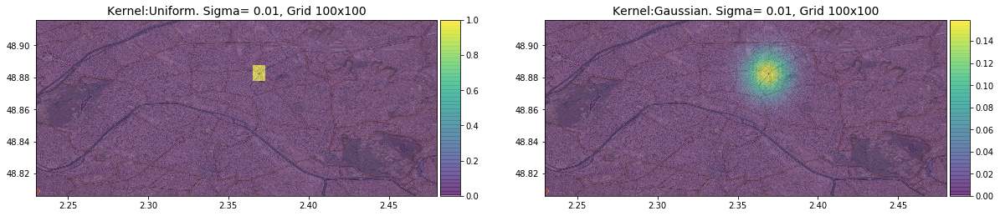

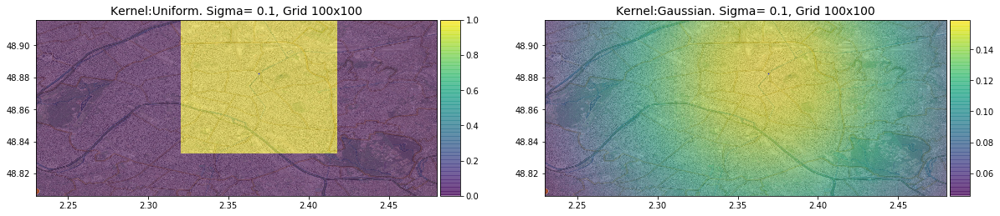

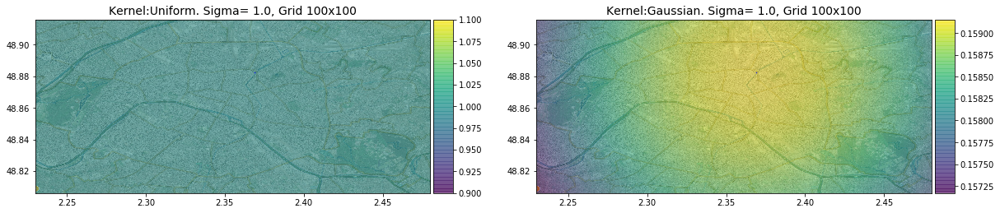

In [14]:
def question14 (x):
    
    grid, steps = Grid()
    sigma = [0.01, 0.1, 1.0]
    n = len(sigma)
     
    for i in range(n):
        
        func_grid_uni = uni(x, grid, sigma[i]).reshape((steps,steps))
        func_grid_gaus = gaussian(x, grid, sigma[i]).reshape((steps,steps))
        
        plt.figure(figsize=(20,6))
    
        plt.subplot(1,2,1)
        show_image (func_grid_uni, x.reshape(1,2), \
                    title = 'Kernel:Uniform. Sigma= {}, Grid {}x{}'.format(round((sigma[i]),4), steps, steps))

        plt.subplot(1,2,2)
        show_image (func_grid_gaus, x.reshape(1,2), \
                    title = 'Kernel:Gaussian. Sigma= {}, Grid {}x{}'.format(round((sigma[i]),4), steps, steps))
           
        plt.show()
    
question14 (geo[3,:])  # au point geo[3,:] 

``(Une note en anglais)`` The greater is sigma the bigger is the Parzen's window and the more near points we can use for the estimation.

#### Q 1.5 

In [15]:
def parzen(x,data,weight,sigma,kernel):
    
    d = x.shape[0]
    
    Ker_i = kernel(x,data,sigma)
    result = np.dot(weight, Ker_i)/(sum(weight)*(sigma**d)) # weight is vect-line (1,n)
    
    return result

#### Q 1.6

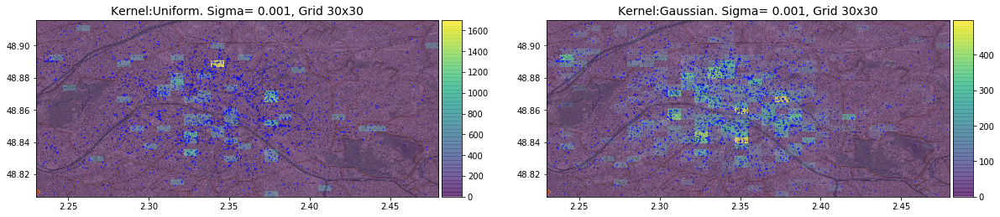

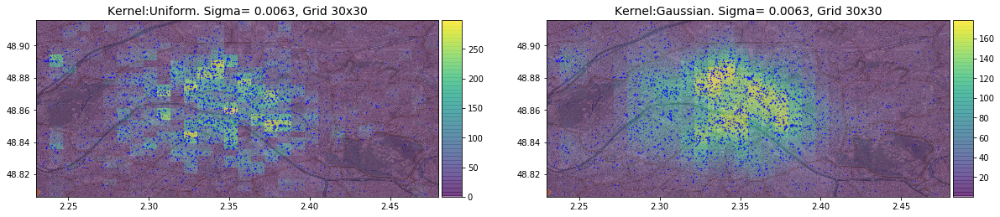

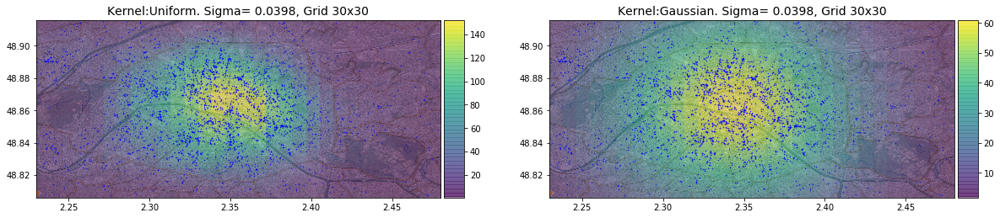

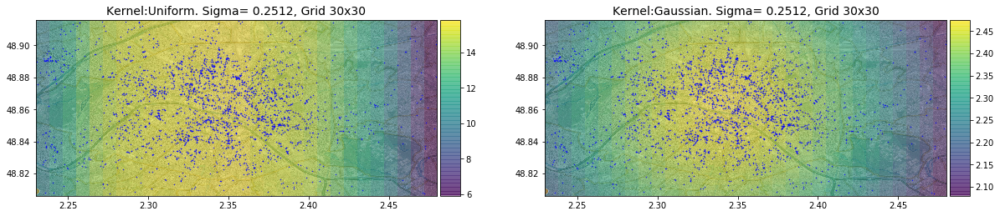

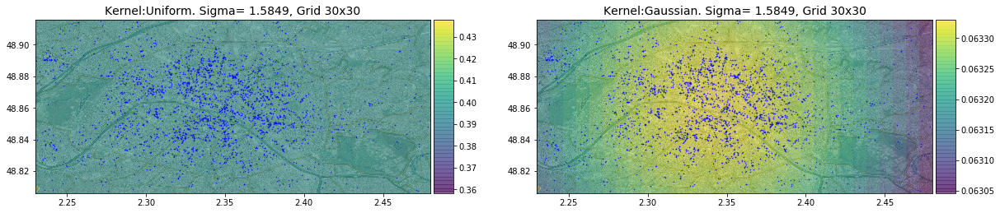

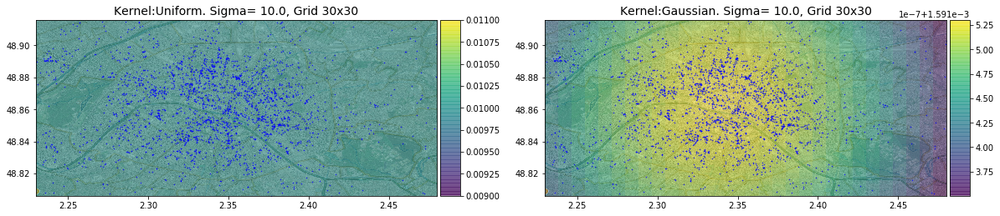

In [16]:
def question16 (sigma = 1.0, steps = 10):

    weight = np.ones(geo.shape[0]) # weight is vect-line (1,n)
    
    grid, _ = Grid(steps)
    
    result_uni=np.array([parzen(g,geo,weight,sigma,uni) for g in grid]).reshape((steps,steps))
    result_gauss=np.array([parzen(g,geo,weight,sigma,gaussian) for g in grid]).reshape((steps,steps))
    
    plt.figure(figsize=(20,6))
    
    plt.subplot(1,2,1)
    show_image (result_uni, geo, title = 'Kernel:Uniform. Sigma= {}, Grid {}x{}'.format(round((sigma),4), steps, steps))
    
    plt.subplot(1,2,2)
    show_image (result_gauss, geo, title = 'Kernel:Gaussian. Sigma= {}, Grid {}x{}'.format(round((sigma),4), steps, steps))
    
    plt.show()
    
def question16_images (n_sigmas = 4, steps = 10):
    sigmas = np.logspace(-3, 1, n_sigmas) # suppose 0.001 < sigma < 10
    
    for i in range (n_sigmas):
        question16(sigmas[i], steps)
    
question16_images (6, 30)  

``(Une note en anglais)``
For very small and very big values of sigma we can't get good results because either we are very localized in points and can't see the nearest ones or the nonvanishing kernel encompass too much data and merge together all the interesting areas of the density under estimation. In addition, when we use kernels the computation time grows because of the evaluation of them in each point of the map (which is approximated by a grid). 
The gaussian kernel gives us a more smooth function than the uniform one.
The Parzen windows method handles better with these difficult positioned points than histogram-based one.

#### Q 1.7
In order to use the least square method, it is necessary to minimize the mean square error with respect to a big number of points. It is difficult problem especially in high dimensional cases or when we want to get a non-linear function as a result. For density estimation we can use some intuitive assumptions about possible distribution of the data. For exemple, we can use the maximum likelihood estimation for the multivariate normal distribution with the mean vector $\mu$ and the covariance matrix $\Sigma.$
$$N(\mu,\Sigma)=\frac{\exp\left(-\frac{1}{2}(x-\mu)^T\Sigma(x-\mu)\right)}{\sqrt{2\pi^d\det\Sigma}}.$$
It is a parametric method because one need to evaluate $\mu$ and $\Sigma$ using the availible data.
In the following code we try to use this idea. The domain (the map) is devided by rectangle areas and we suppose that the data in such an area have the multivariate normal distribution.  We approximate the density in an area with points $\mathbf\{x_i\}_{i=1}^n$ by the formula
$$N(\hat{\mu},\hat{\Sigma})=\frac{\exp\left(-\frac{1}{2}(x-\hat{\mu})^T\hat{\Sigma}(x-\hat{\mu})\right)}{\sqrt{2\pi^d\det\hat{\Sigma}}},$$
where $$\hat{\mu}=\frac{1}{n}\sum_{i=1}^n\mathbf{x}_i$$ and $$\hat{\Sigma}=\frac{1}{n}\sum_{i=1}^n\left(\mathbf{x}_i-\hat{\mu}\right)\left(\mathbf{x}_i-\hat{\mu}\right)^T$$ are the MLE for the parameters $\mu$ and $\Sigma$.

In [17]:
def dots_in_box (data, cellule): # cellule = [X_min, X_max, Y_min, Y_max]
    # création d'un ensemble de points dans la cellule
    dots = np.array([[data[i,0],data[i,1]] for i in range(data.shape[0]) \
                            if (data[i,0]>=cellule[0])and(data[i,0]<cellule[1]) \
                                   and (data[i,1]>=cellule[2])and(data[i,1]<cellule[3])])
    return np.matrix(dots)

def Likelihood(data): # data est (n x d)-matrice de points à la cellule
    
    means = data.mean(axis=0)
    data_centre = data - means
    
    variance = np.dot(data_centre[:,].T, data_centre[:,])/data.shape[0]
    
    # return the maximal likelihood estimation
    return means.reshape(1,2), variance


def question17 (grille = [10,10]):
    h_x = (xmax - xmin)/grille[0]
    h_y = (ymax - ymin)/grille[1]
    Size = grille[0]*grille[1]
    C_xi = np.arange(xmin, xmax+h_x, h_x)
    C_yi = np.arange(ymin, ymax+h_y, h_y)
    
    STEPS = 10 # for every cell in the grid, it is just for graphs 
    
    plt.figure(figsize=(15,15))
    show_map()
    
    for i in range(grille[0]):
        for j in range(grille[1]):
            cellule = [C_xi[i], C_xi[i+1], C_yi[j], C_yi[j+1]]
            
            xx,yy=np.meshgrid(np.linspace(C_xi[i],C_xi[i+1],STEPS),np.linspace(C_yi[j],C_yi[j+1],STEPS))
            grid = np.c_[xx.ravel(),yy.ravel()]
            
            dots = dots_in_box(geo, cellule)
            
            if dots.size: # if we have more than zero points (otherwise we can't evaluate \Sigma^{-1})
                mean, variance = Likelihood(dots) 
                detVar = LA.det(variance)
                grid_m = grid-mean
                
                if detVar > 0:
                    #estim_dens = np.exp(-0.5*LA.multi_dot([grid_m[:,], LA.inv(variance), grid_m[:,].T]))
                    estim_dens = np.array([np.exp(-0.5*LA.multi_dot([(g-mean), LA.inv(variance), (g-mean).T]))for g in grid])
                    estim_dens = estim_dens/np.sqrt(2*np.pi**2*detVar)
                    estim_dens = estim_dens.reshape((STEPS,STEPS))
                    
                else:
                    estim_dens = np.zeros(grid.shape[0]).reshape((STEPS,STEPS))
            else:
                estim_dens = np.zeros(grid.shape[0]).reshape((STEPS,STEPS))
                
            plt.imshow(estim_dens,extent=[C_xi[i],C_xi[i+1],C_yi[j],C_yi[j+1]],interpolation='none',alpha=0.5,origin = "lower")                
    
    plt.title('Maximum likelihood estimation. Grid '+str(grille[0])+'x'+str(grille[1]))
    plt.scatter(geo[:,0],geo[:,1],alpha=0.8,s=0.3,color="blue")
    plt.show()


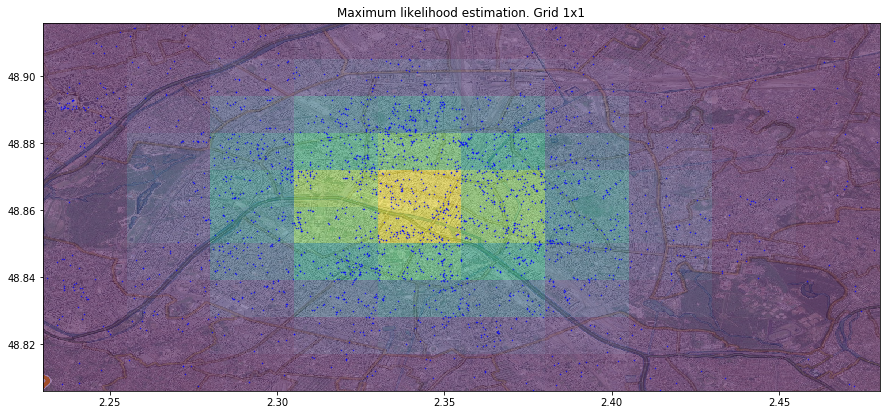

In [18]:
question17([1,1])

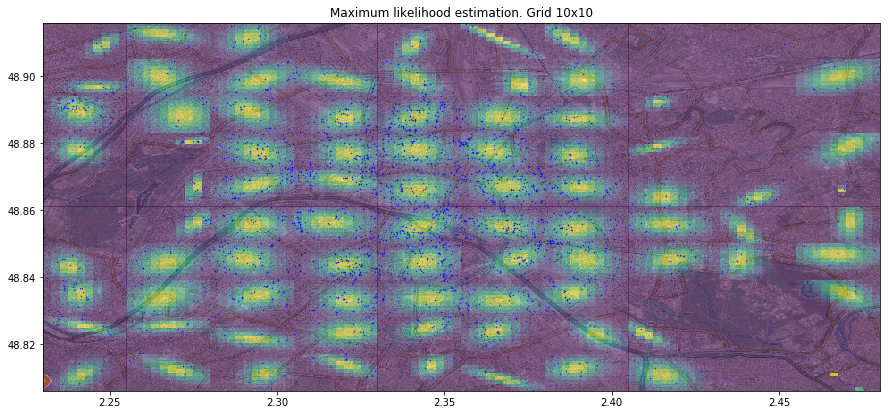

In [19]:
question17([10,10])

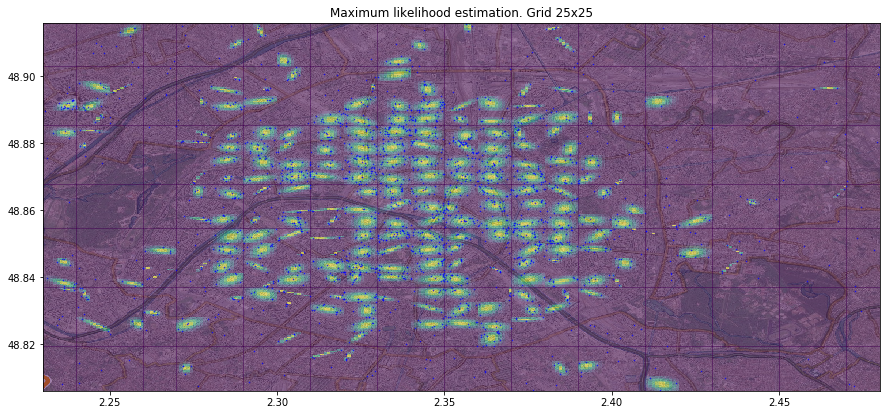

In [20]:
question17([25,25])

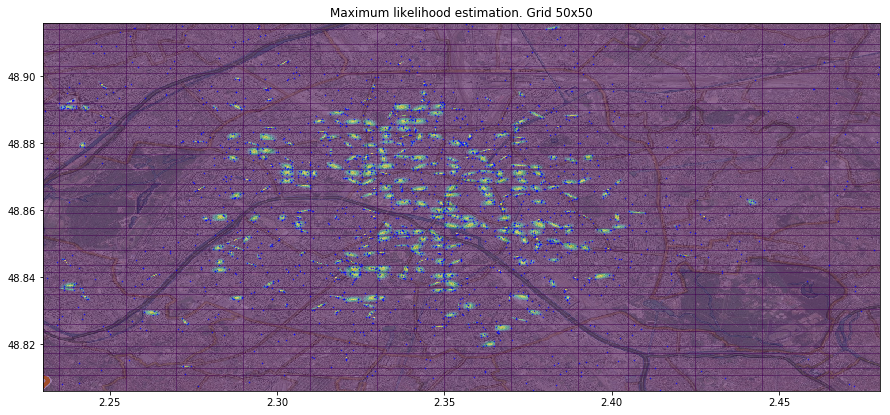

In [21]:
question17([50,50])

``(Une note en anglais)``
As we see, in our approach it is important to choose the appropriate size of the grid. A very big grid don't distinguish the data points whereas a small grid considers only densely located points. Also we don't evaluate the estiamtion in the cells with one point otherwise we wolud have something like a "noise" when the one point cells contribute a lot in the final density. Maybe, one of the improvements is to build adaptively a grid and to adjust the size of cell according to the location of the data points. Finally, there are some problems with the normalizing of result. We just divide the values by the number of cells because theoretically there is a normalized density in each cell, but in practice the whole distribution doesn't fill only one cell and can be continued to closest ones.

## 2 Estimateur de Nadaraya-Watson

L’estimateur de Nadaraya-Watson permet d’adapter les fenêtres de Parzen à la régression locale. Soit $f : R^d → R $ fonction objectif, l’estimateur $\hat{f}$ sur un échantillon $\{(x^i, y^i = f(x^i))\}_{i=1}^{n}$ est défini par
$$ \hat{f} = \frac{\sum_{i=1}^{n} y^i  K(\frac{x - x^i}{\sigma})}{\sum_{i=1}^{n} K(\frac{x - x^i}{\sigma})} $$ 
Dans les questions suivantes, on veut modéliser $f_{s,d}(t)$ le nombre de vélibs empruntés en fonction du temps à une station s pour une journée $d$.

#### Q 2.1

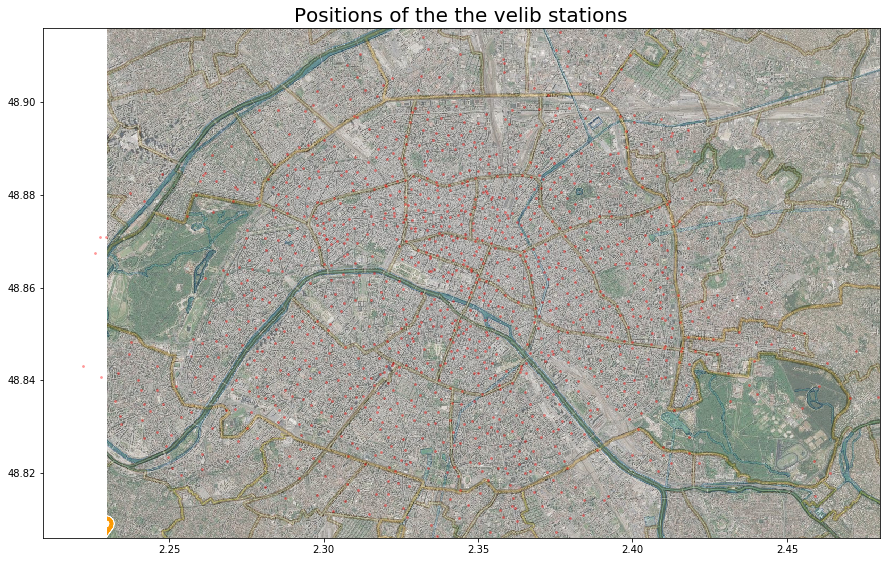

Problems with a range of data for the velib stations :Xmin =2.2222, Xmax =2.4795 
 more than data of the map.


In [22]:
#### Traitement des donnees velib ######
with  np.load("velib-enpc.npz") as obj:
    # Dictionnaire des informations des stations idvelib->(nom,adresse,x,y,nbre attaches,long,lat)
    stations = dict(obj['stations'].tolist())
    # Correspondance idvelib->ligne matrice
    stations_idx = dict(obj['stations_idx'].tolist())
    # Correspondance ligne matrice->idvelib
    idx_stations = dict(obj['idx_stations'].tolist())
    # Matrice du nombre de velos dispo par station par minute
    dispo = obj['histo']

# la matrice du nombre de vélos empruntés
velo_empr = np.maximum(0,dispo[:,1:]-dispo[:,:-1])
  
# the geopositions of the velib stations
velib_mat = np.array([[x[6],x[5]] for x in stations.values()])
#velib_mat = np.array([[stations[idx_stations[idx]][6], stations[idx_stations[idx]][5]] for idx in range(len(stations))])

## Affichage 
plt.figure()
show_map()
plt.scatter(velib_mat[:,0],velib_mat[:,1], alpha=0.3,s=3.5,color="red")
plt.title('Positions of the the velib stations', fontsize = 20)
plt.show()

#xmin,xmax = 2.23,2.48   ## coord_x min et max
print('Problems with a range of data for the velib stations :'+
      'Xmin ={}, Xmax ={} \n more than data of the map.'.format(round(min(velib_mat[:,0]),4), \
                                                               round(max(velib_mat[:,0]),4)))

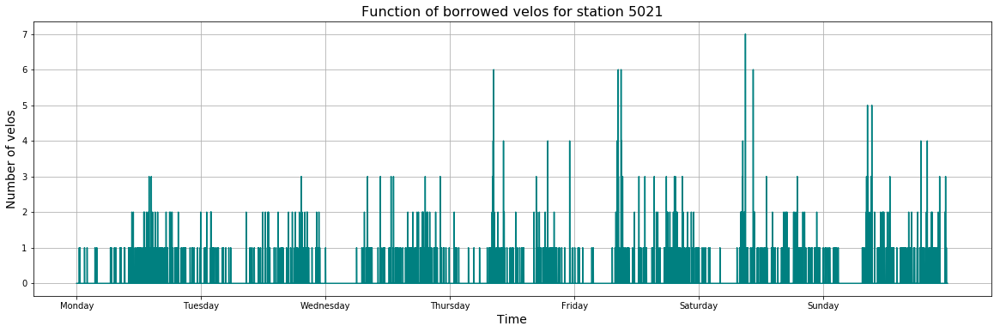

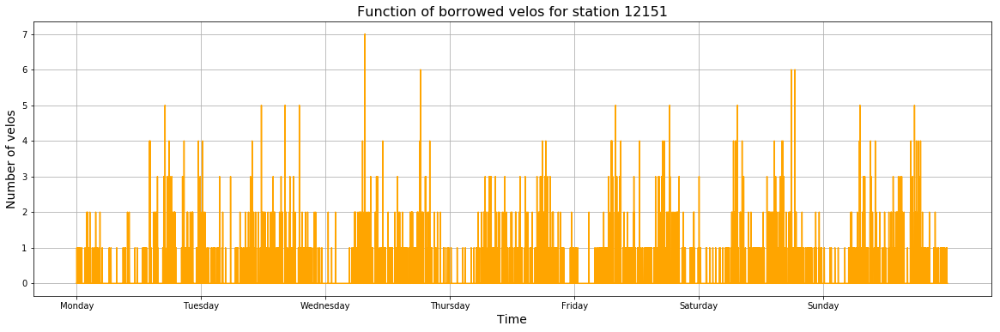

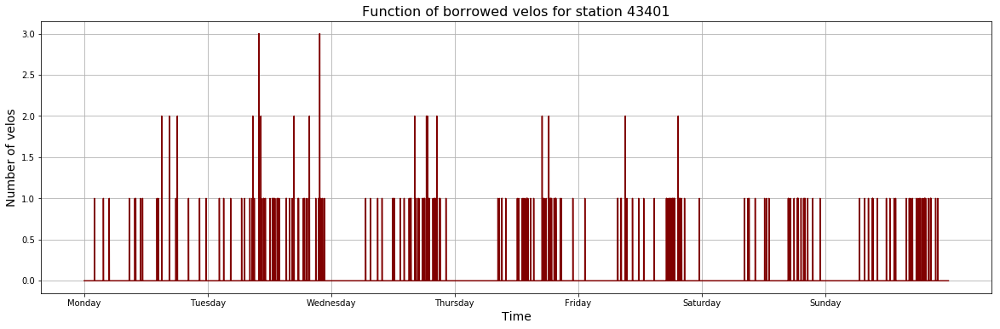

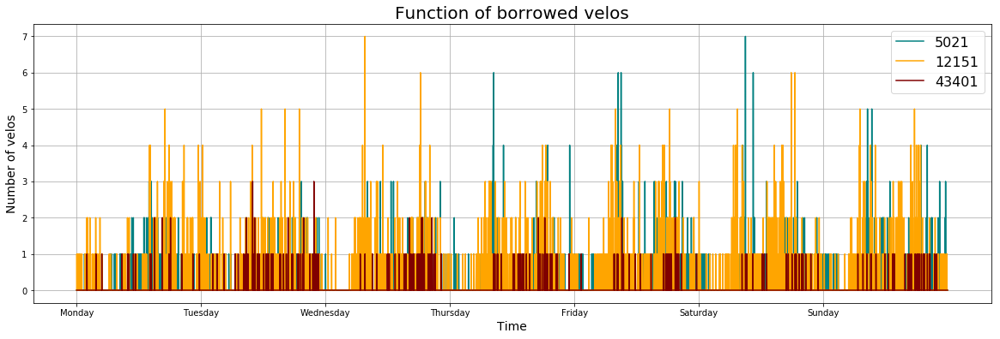

In [23]:
from itertools import cycle

def question21 (stations, days = 7): 
    n = len(stations)
    step_temp = 24*60 # 1 day = 1440 minutes
    temp = days*step_temp 
    
    plt.rcParams['figure.figsize'] = [20.0, 20.0]
    colors = ['teal', 'orange', 'maroon']
    noms_for_days_gen = cycle(['Monday', 'Tuesday', 'Wednesday','Thursday',\
                                  'Friday', 'Saturday', 'Sunday'])
    
    noms_for_days = [next(noms_for_days_gen) for i in range(days)]
    
    plt.figure()
    
    
    for i in range(n):
        
        plt.subplot(n,1,i+1)
        plt.plot(velo_empr[stations_idx[stations[i]],0:temp], color = colors[i])
        plt.title('Function of borrowed velos for station {}'.format(stations[i]), fontsize = 16)
        plt.xlabel('Time', fontsize = 14)
        plt.ylabel('Number of velos', fontsize = 14)
        plt.xticks(np.arange(0, temp, step=step_temp), noms_for_days, rotation='horizontal')
        plt.grid()
        
        plt.show()

    plt.figure(figsize=(20,6))
    
    plt.xlabel('Time', fontsize = 14)
    plt.ylabel('Number of velos', fontsize = 14)
    plt.title('Function of borrowed velos', fontsize = 20)
    plt.xticks(np.arange(0, temp, step=step_temp), noms_for_days, rotation='horizontal')
    for i in range(n):
        plt.plot(velo_empr[stations_idx[stations[i]],0:temp], label = '{}'.format(stations[i]), color = colors[i])

    plt.legend(fontsize = 16)
    plt.grid()
    plt.show()
    
question21 ([5021, 12151, 43401], 7) # numeros de stations et numéro de jours

``(Une note en anglais)``
The difference between stations is in their locations. So people use bicycles more or less often depending on the city region, popularity of bicycles in this region or relevance of them. The days are similar to each other and we can note that people use bicycles more often in the mornings or in the evening. Concerning the regularity of the data, it seems that the distribution of the borrowed bicycles is close to the gaussian with two modes having means in the morning and in the evening.

#### Q 2.2

In [24]:
def fonc_s_d (day, station = 5021):
    step_temp = 24*60 # 1 day = 1440 minutes
    time_period = np.array(range(0,step_temp))
    
    data = []
    data.append(time_period)
    
    for i in day :
        temp0 = i*step_temp
        temp1 = (i+1)*step_temp
        data.append(velo_empr[stations_idx[station],temp0:temp1])
    
    # the first column of data contains the minutes under consideration
    # the second column and others of data contain the number of borrowed bicycles in the fix days
    return np.array(data).T
    
def Nadaraya_Watson(x, data, kernel,sigma):
    # x is a moment in time in minutes
    # the first column of data contains the minutes under consideration
    # the second column of data contains the number of borrowed bicycles
    n, m = data.shape
    time_period = data[:,0:1]
    numb_vel = data[:,1:]
    
    Ker_i = kernel(x, time_period, sigma)
    result = np.sum(np.dot(numb_vel.T, Ker_i)/sum(Ker_i))
    return result

In [25]:
def show_image_NW(data, time_period, sigma, NoM=1, n_kernel=''):
    
    plt.figure(figsize=(20,6))
    plt.plot(data, label = 'Estimated data \n ( Kernel {})'.format(n_kernel))
    plt.xlabel('Time (hours)', fontsize = 14)
    plt.ylabel('Number of velos', fontsize = 14)
    plt.title('Function of borrowed velos. Sigma= {}, Number of Mondays used: {}'.format(sigma, NoM), fontsize = 16)
    plt.xticks(np.arange(0, len(time_period), step=60), range(100) )
    plt.grid()
    plt.legend(fontsize = 16)
    plt.show()
    
    
def question22(sigma, kernel, n_kernel='', station = 5021): # le premier lundi est 3 oct 2016
    
    for i in range (4):
        day = np.array([2, 9, 16, 23]) # liste des lundis d'octobre 2016
        data_gen = fonc_s_d (day[0:(i+1)], station)
        time_period = data_gen[:,0]
        estim_NW = np.array([Nadaraya_Watson(np.array([x]), data_gen, kernel, sigma) for x in time_period])
        show_image_NW(estim_NW, time_period, sigma, i+1, n_kernel)

#### Uniform Kernel :

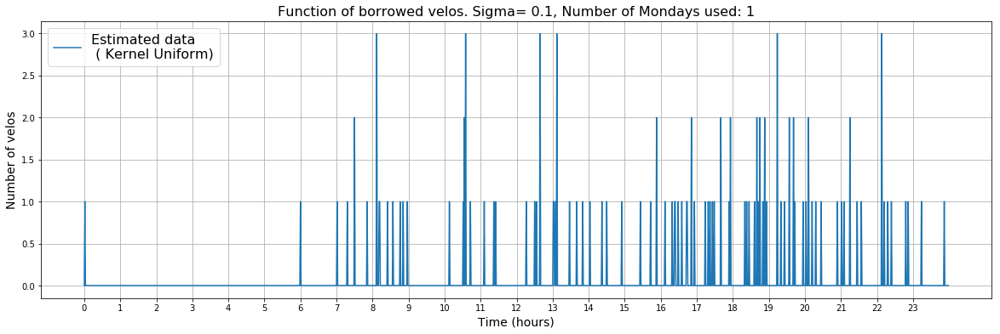

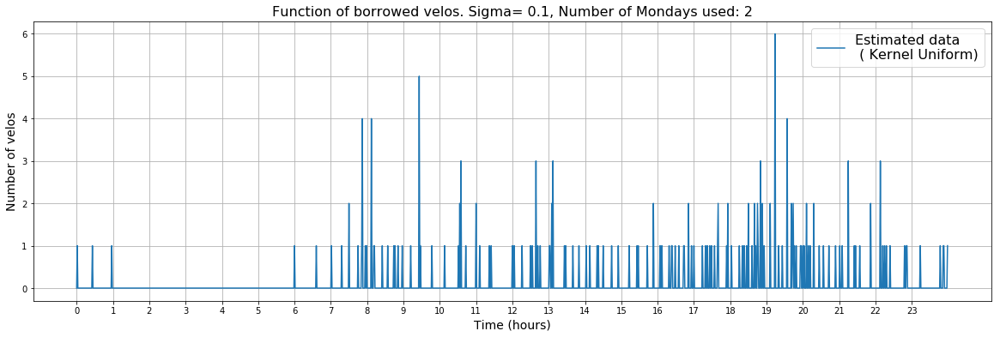

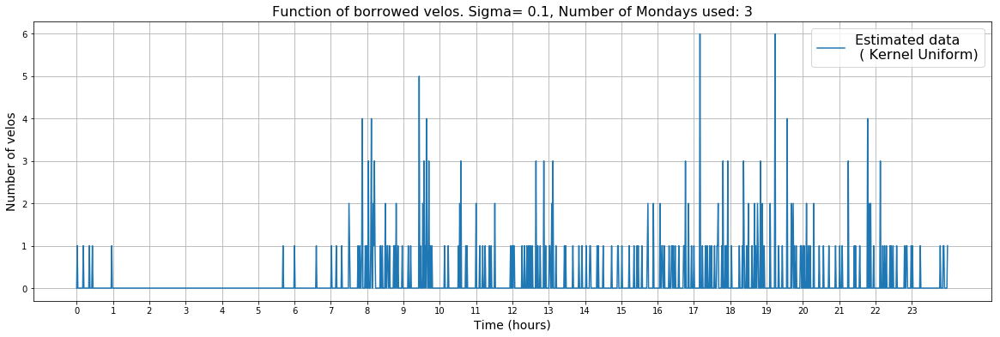

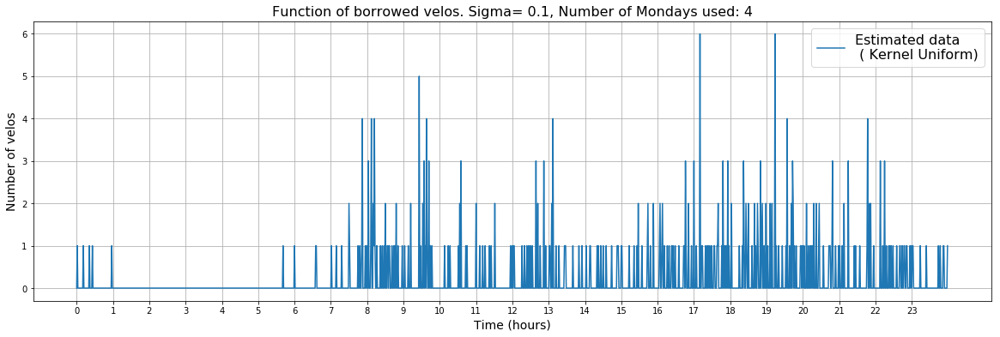

In [26]:
question22(0.1, uni, n_kernel='Uniform')  

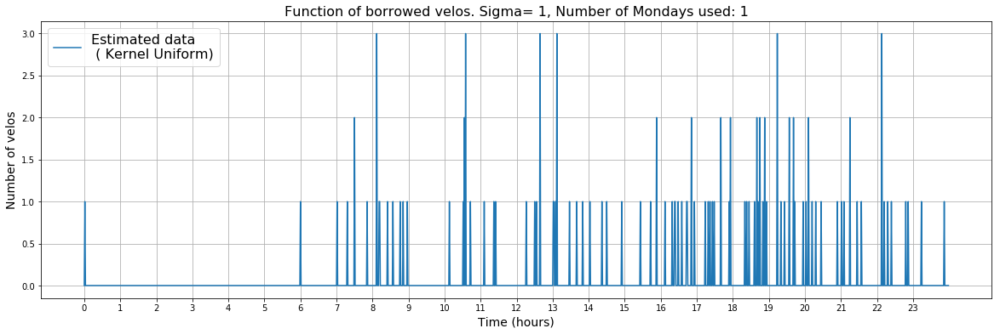

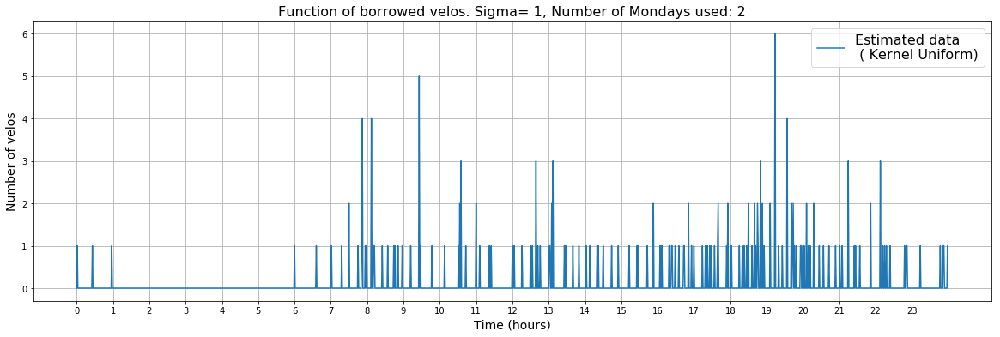

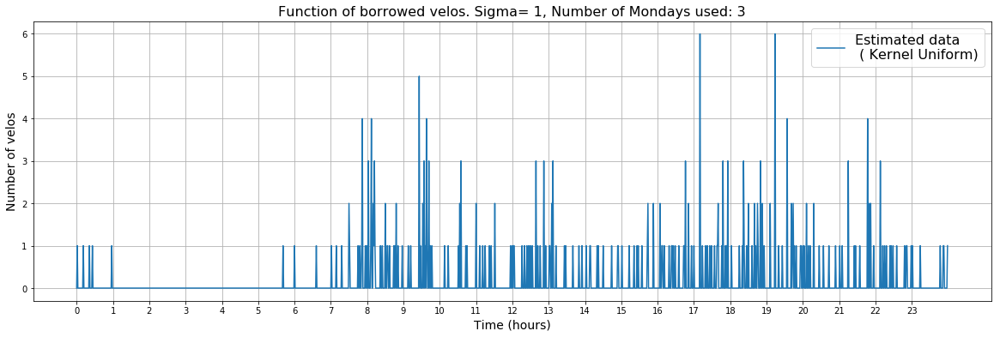

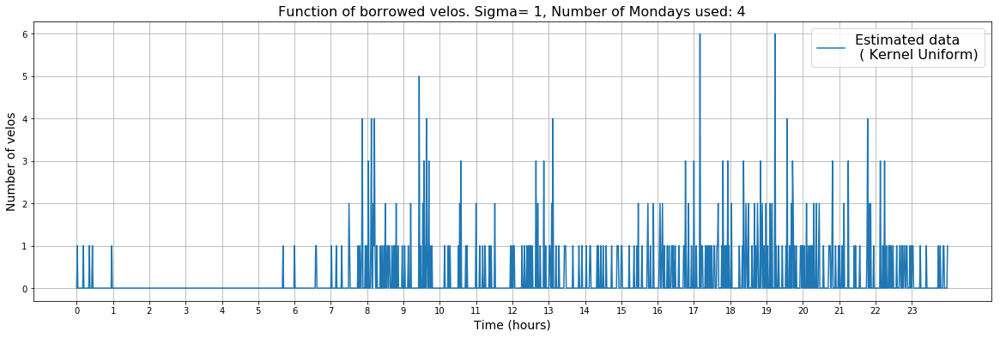

In [27]:
question22(1, uni, n_kernel='Uniform')   

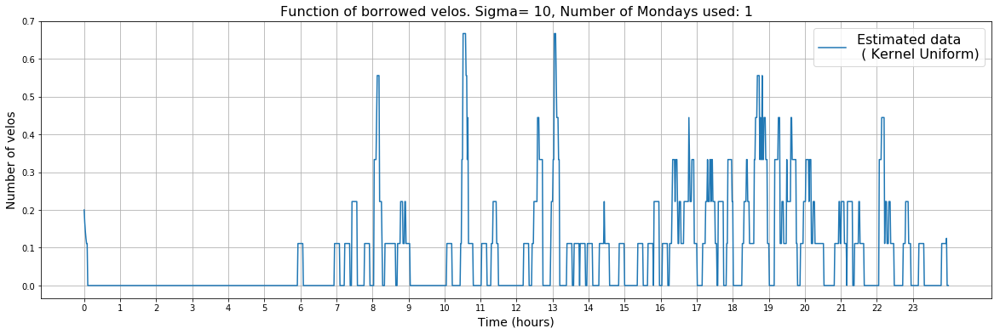

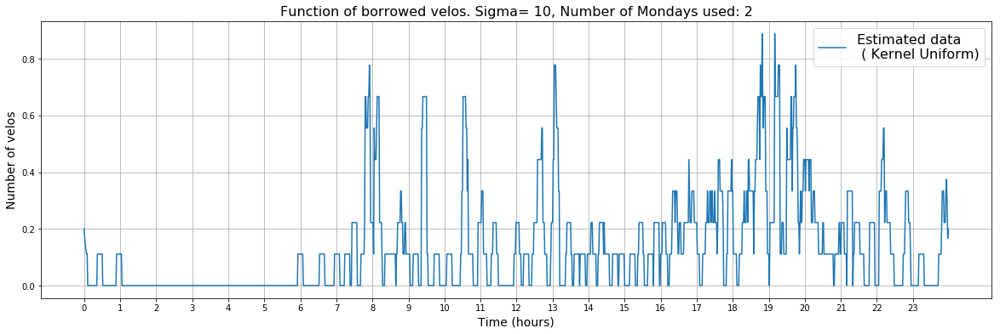

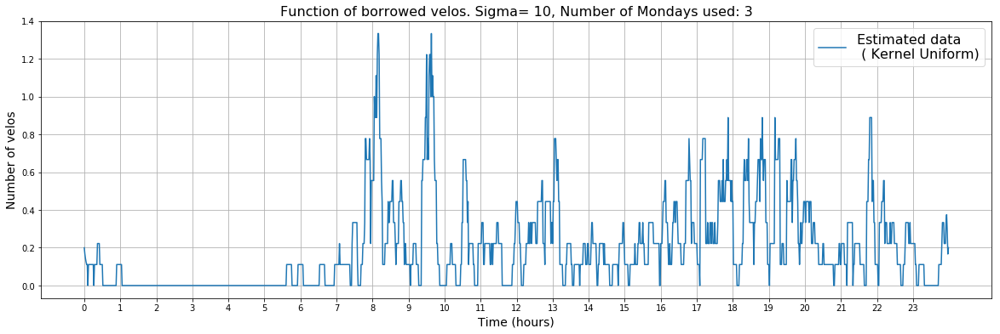

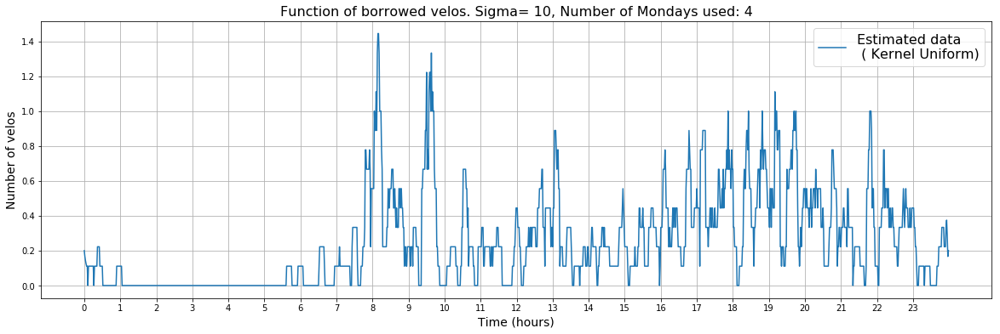

In [28]:
question22(10, uni, n_kernel='Uniform')  

#### Gaussian Kernel :

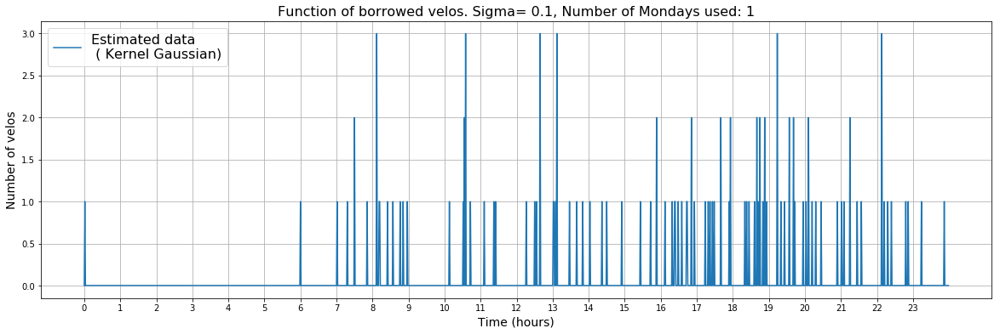

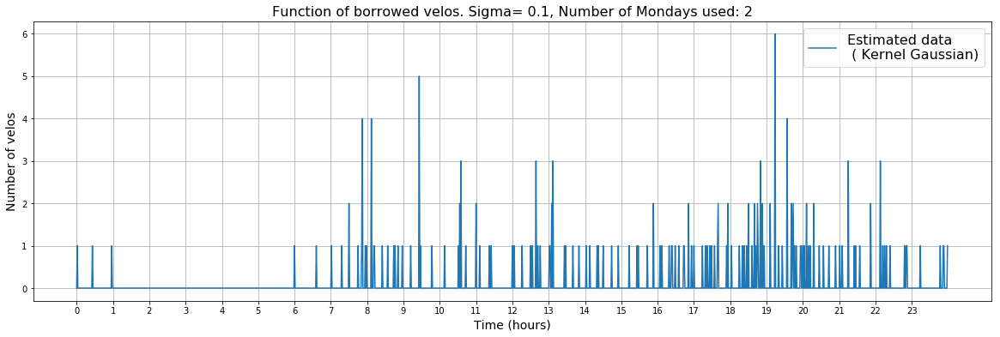

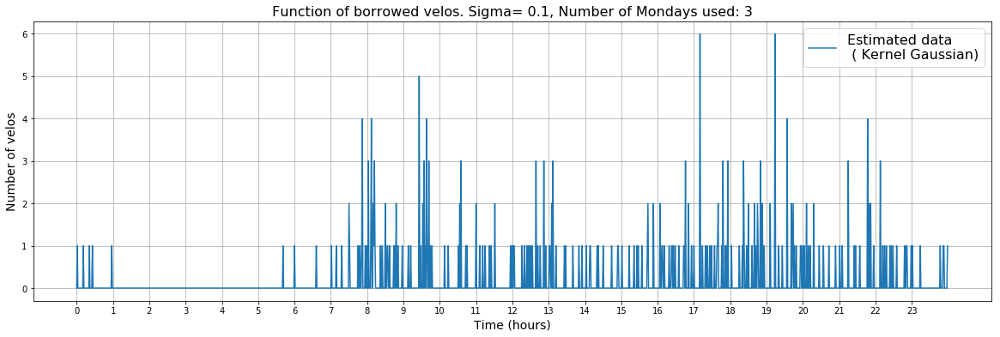

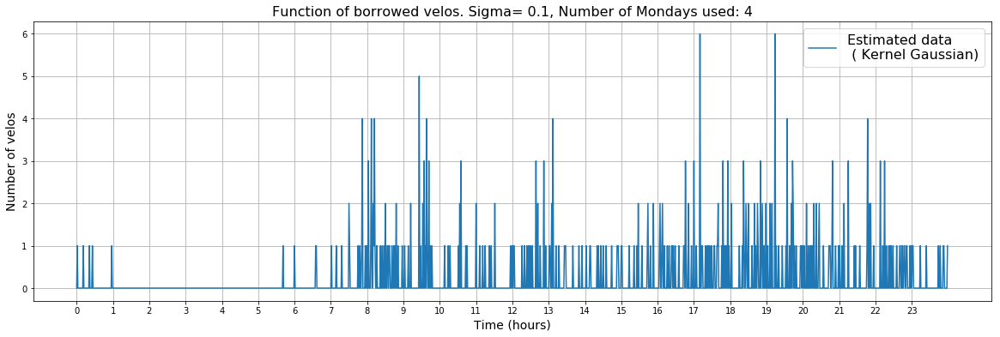

In [29]:
question22(0.1, gaussian, n_kernel='Gaussian')   

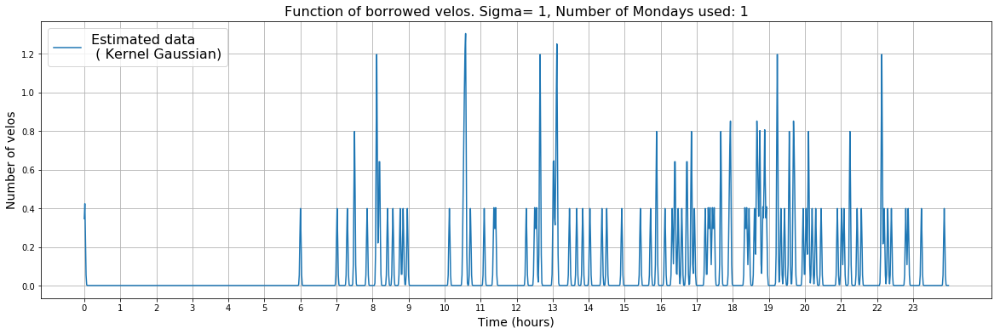

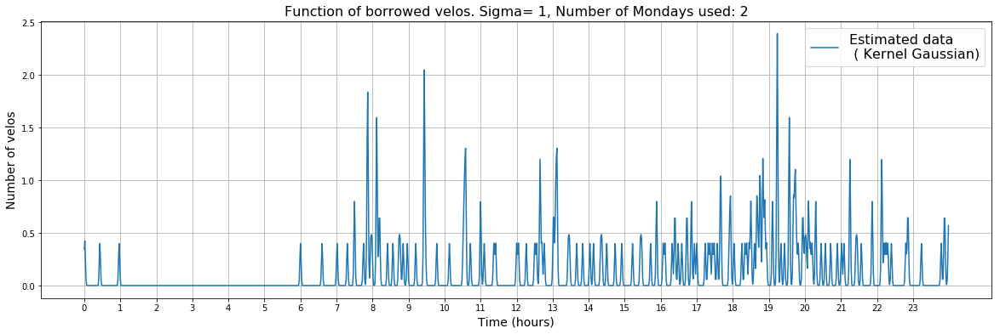

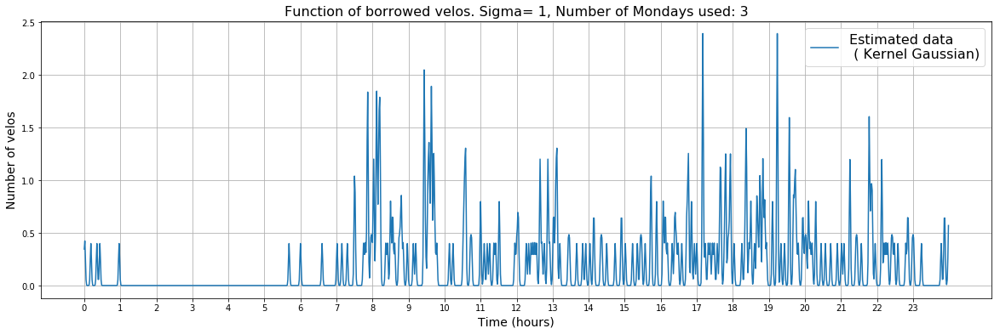

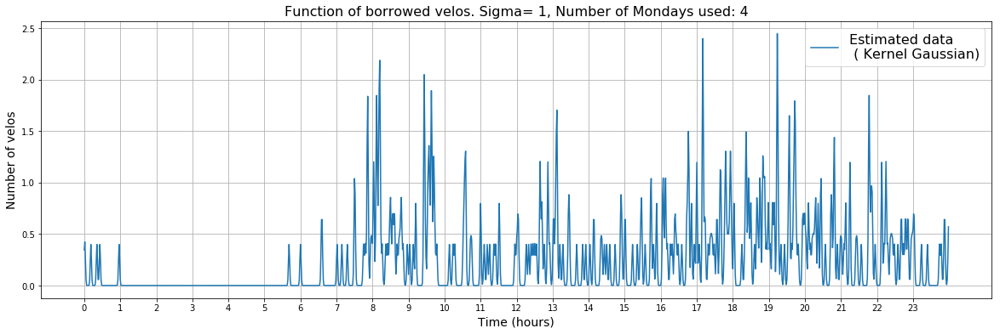

In [30]:
question22(1, gaussian, n_kernel='Gaussian')   

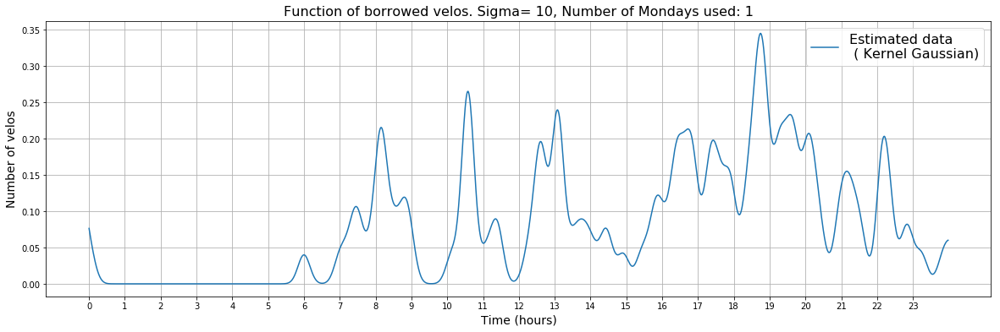

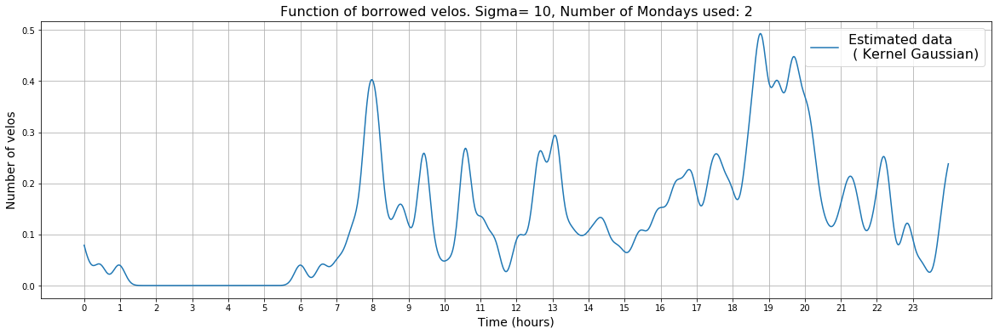

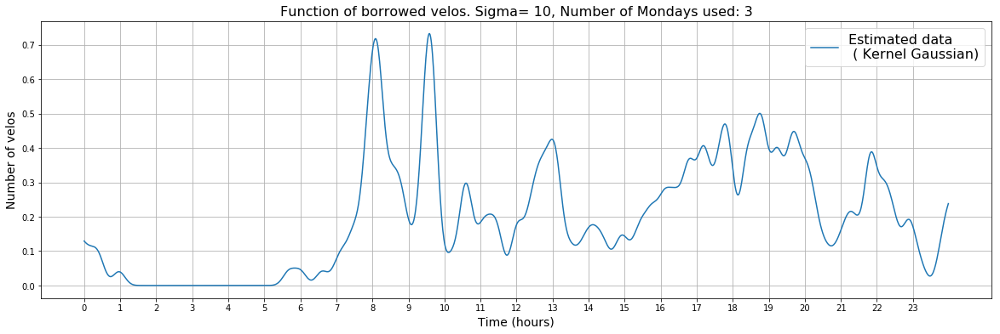

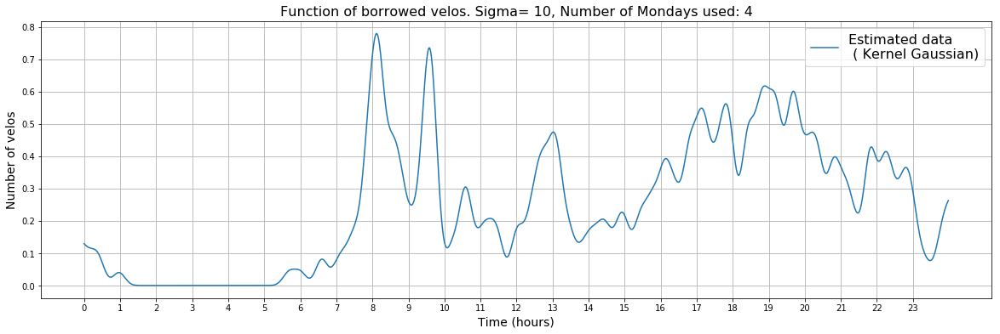

In [31]:
question22(10, gaussian, n_kernel='Gaussian')   

``(Une note en anglais)``
When we use more data (more Mondays) the estimation begins to show more common behavior and demonstrate some features of the whole array of the data. It forgets some peculiarities of the particular day. The choice of sigma permits to consider near moments of time, get smooth estimation and generalise the data. It is also the case for kernels: with the uniform kernel we don't have smooth curves.

## 3 K plus proches voisins

#### Q 3.1
``(Une note en anglais)``
In the case of the lack of the data for a certain station, we can use the data from the near stations. And the closer is a station the more influnce it has. The Nadaraya-Watson method can weight the stations according to their proximity.

In [32]:
def fonc_s_d_stations (day, data_empr = velo_empr, data_coord = velib_mat):
    
    step_temp = 24*60 # 1 day = 1440 minutes
    time_period = np.array(range(0,step_temp))
    
    
    coordinates = data_coord
    
    temp0 = day*step_temp
    temp1 = (day+1)*step_temp
        
    data = np.hstack((coordinates, velo_empr[:,temp0:temp1]))
        
    # the first two columns of data contains the coordinates of the stations
    # the others of data contain the number of borrowed bicycles in the fix day
    return data
    
def Nadaraya_Watson_stations(x, data, kernel,sigma):
    # x is a moment in time in minutes
    # the first column of data contains the minutes under consideration
    # the second column of data contains the number of borrowed bicycles
    coordinates = data[:,0:2]
    numb_vel = data[:,2:]
    
    Ker_i = kernel(x, coordinates, sigma)
    result = np.dot(numb_vel.T, Ker_i)/sum(Ker_i)
    
    return result

In [33]:
def show_image_NW_stations(data_x, data, time_period, sigma, n_kernel=''):
    
    plt.figure(figsize=(20,6))
    plt.plot(data_x, label = 'Exact data')
    plt.plot(data, label = 'Estimated data \n ( Kernel {})'.format(n_kernel))
    plt.xlabel('Time (hours)', fontsize = 14)
    plt.ylabel('Number of velos', fontsize = 14)
    plt.title('Function of borrowed velos. Sigma= {}'.format(sigma), fontsize = 16)
    plt.xticks(np.arange(0, len(time_period), step=60), range(100) )
    plt.grid()
    plt.legend(fontsize = 16)
    plt.show()

In [34]:
def question31(sigma, kernel, n_kernel='', ind_station = 5021):
    # we would estimate data for 1 day for one station 
    # using data for the all others stations in the particular day
    step_temp = 24*60 # 1 day = 1440 minutes
    time_period = np.array(range(0,step_temp)) 
    
    day = 2 # 3 oct 2016 
    
    data_station_in_days = fonc_s_d_stations(day)
    data_without_station = np.delete(data_station_in_days, stations_idx[ind_station], 0) # delete data for one station
    
    x = data_station_in_days[stations_idx[ind_station], 0:2] # coordinates of station
    data_exact = data_station_in_days[stations_idx[ind_station], 2:]
    
    estim_NW = Nadaraya_Watson_stations(x, data_without_station, kernel, sigma)
    
    show_image_NW_stations(data_exact, estim_NW, time_period, sigma, n_kernel)    

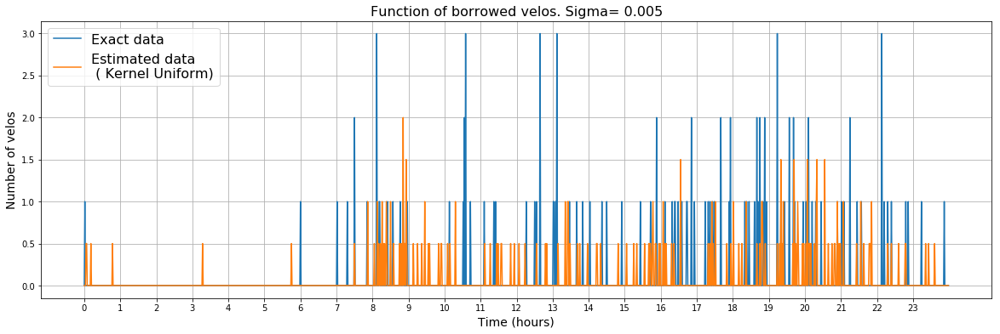

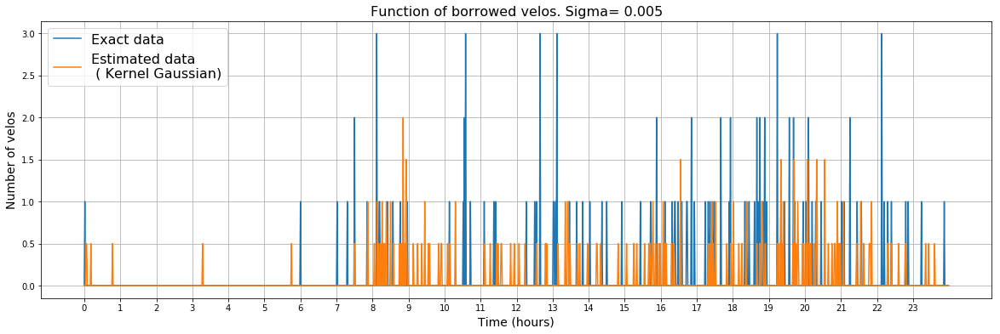

In [35]:
question31(0.005, uni, n_kernel='Uniform')
question31(0.005, uni, n_kernel='Gaussian')

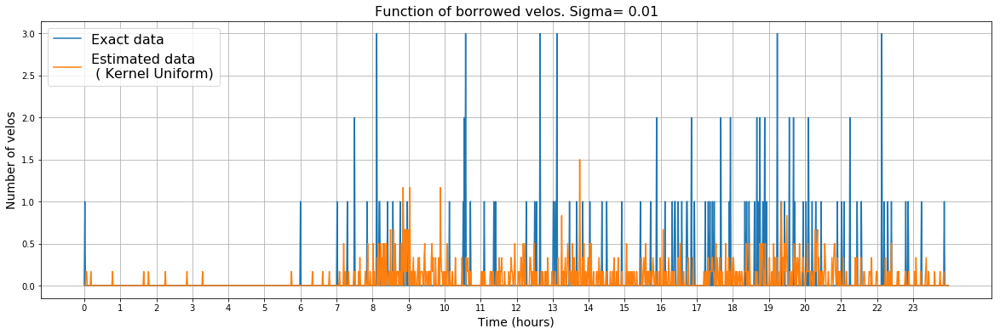

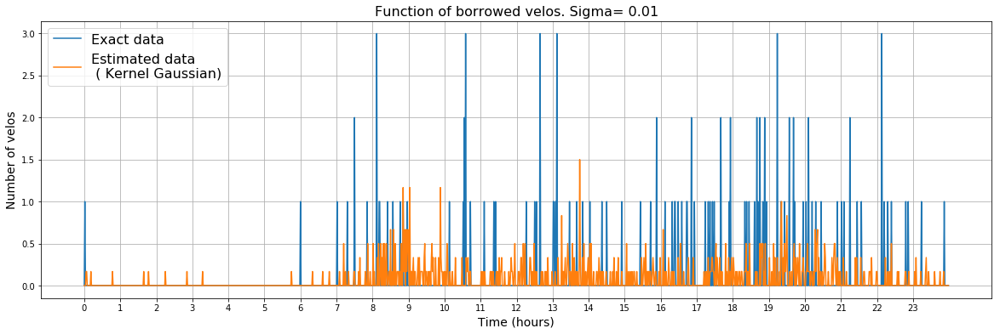

In [36]:
question31(0.01, uni, n_kernel='Uniform')
question31(0.01, uni, n_kernel='Gaussian')

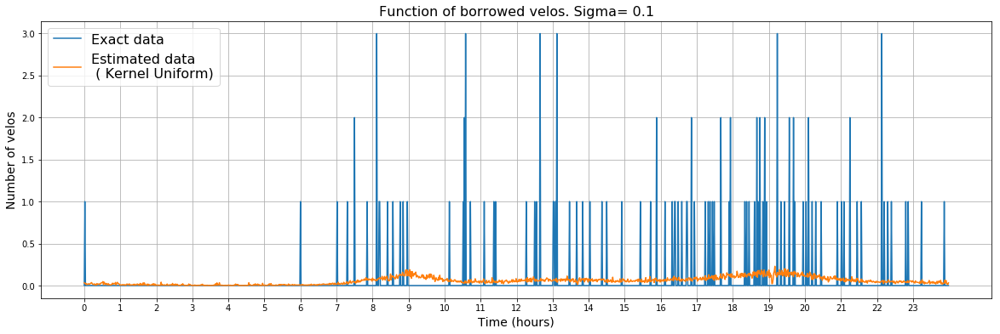

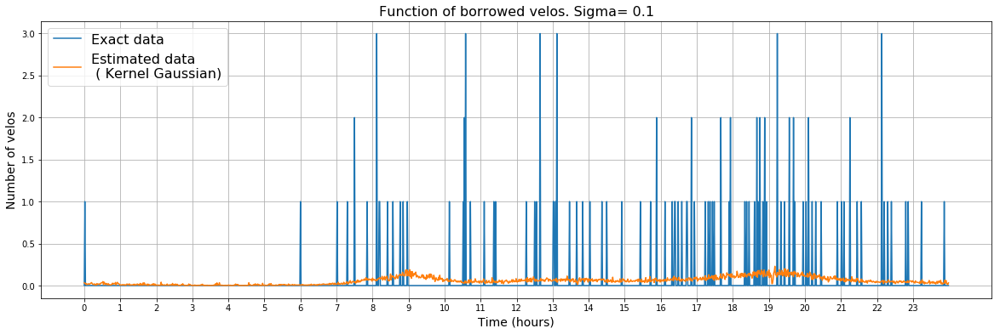

In [37]:
question31(0.1, uni, n_kernel='Uniform')
question31(0.1, uni, n_kernel='Gaussian')

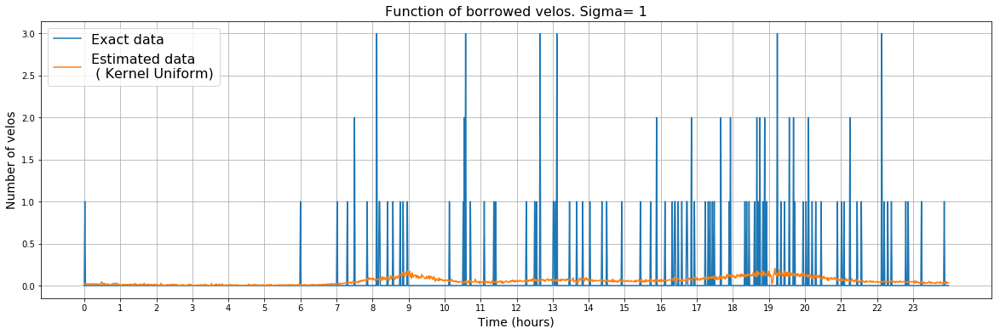

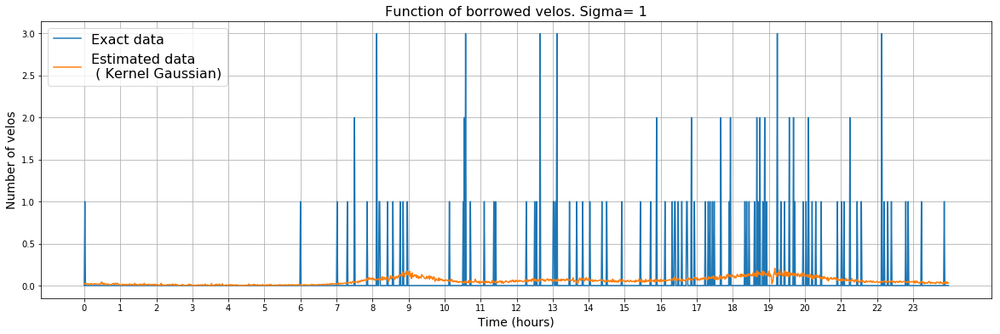

In [38]:
question31(1, uni, n_kernel='Uniform')
question31(1, uni, n_kernel='Gaussian')

``(Une note en anglais)``
Here we observe that results begins to change only for big values of the parameter $\sigma$. It means that near the chosen station we don't have a lot of near stations and we can get some additional data only when $\sigma$ is big. But in this case the obtained curves include the information from the far stations which can be not important for the chosen one.

#### Q 3.2
``(Une note en anglais)``
If the region around the station has a small number of other stations, we can't get a correct estimation by changing the bandwidth of the kernel. And we don't know how many stations we consider for fixed bandwidth. The kernel can takes into account many stations which are far from the chosen one or vice versa it can't "see" any source of data. The K nearest neighbors method handles these problems by a direct limiting of the number of stations whose data we use for the estimation.

In [39]:
def KNN(x, data, number_nn = 1): 
    # x is the coordinate of one station
    # the first two columns of the data array contain the coordinates of the stations
    # the third column of data contains the number of borrowed bicycles
    coordinates = data[:,0:2]
    difference = coordinates - x
    dist = LA.norm((coordinates - x), axis = 1).reshape(data.shape[0],1)
    
    data_KNN = np.hstack((dist, data[:,2:]))
    data_KNN_sorted = data_KNN[data_KNN[:,0].argsort()]
    data_KNN_sorted = data_KNN_sorted[0:number_nn, :]
    
    result = np.sum(data_KNN_sorted, axis=0)/number_nn
    return result

In [40]:
def show_image_KNN(data_x, data, time_period, K):
    
    plt.figure(figsize=(20,6))
    plt.plot(data_x, label = 'Exact data')
    plt.plot(data, label = 'Estimated data')
    plt.xlabel('Time (hours)', fontsize = 14)
    plt.ylabel('Number of velos', fontsize = 14)
    plt.title('Function of borrowed velos. K = {}'.format(K), fontsize = 16)
    plt.xticks(np.arange(0, len(time_period), step=60), range(100) )
    plt.grid()
    plt.legend(fontsize = 16)
    plt.show()
    
def question32( K, ind_station = 5021):
    # we would estimate data for 1 day for one station 
    # using data for the K nearest stations in the particular day
    
    step_temp = 24*60 # 1 day = 1440 minutes
    time_period = np.array(range(0,step_temp)) 
    
    day = 2 # 3 oct 2016 
    
    data_station_in_days = fonc_s_d_stations(day)
    data_without_station = np.delete(data_station_in_days, stations_idx[ind_station], 0) # delete data for one station
    
    x = data_station_in_days[stations_idx[ind_station], 0:2] # coordinates of station
    data_exact = data_station_in_days[stations_idx[ind_station], 2:]
    
    estim_KNN = KNN(x, data_without_station, K)
    
    show_image_KNN(data_exact, estim_KNN, time_period, K)    

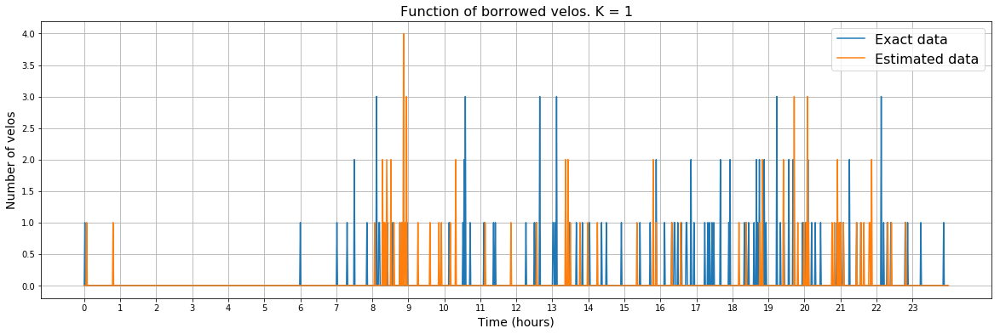

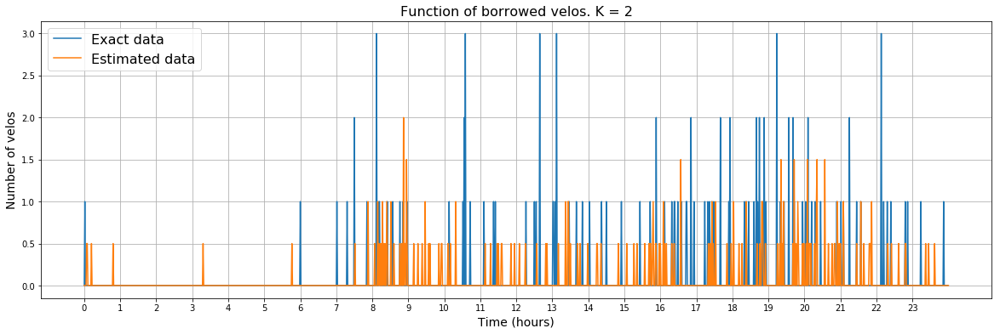

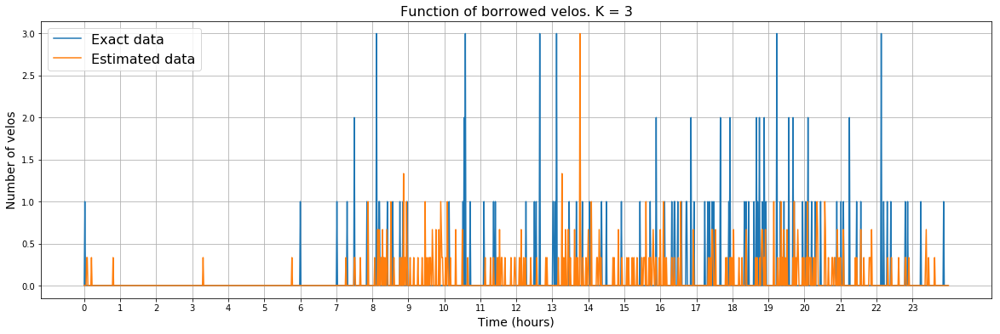

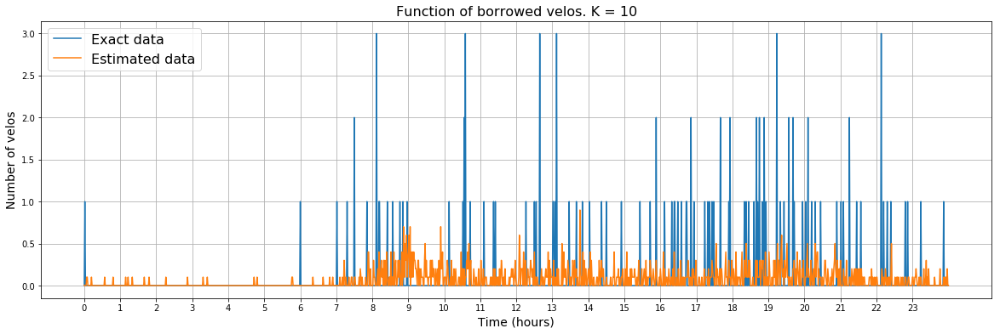

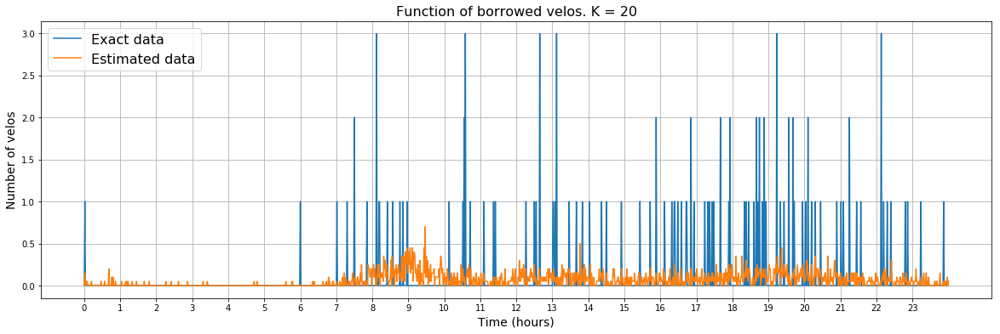

...

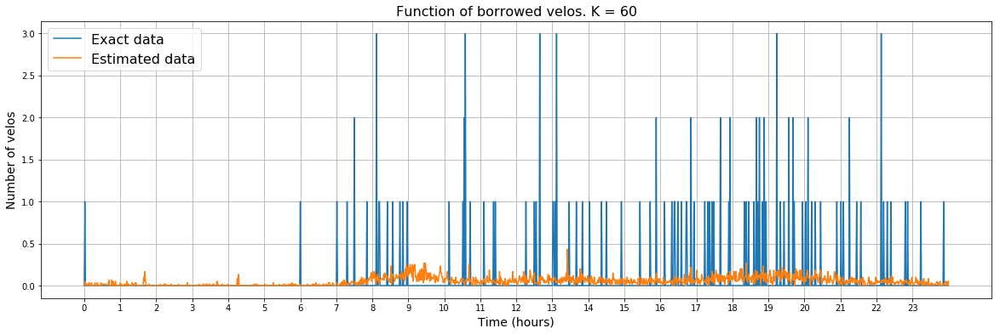

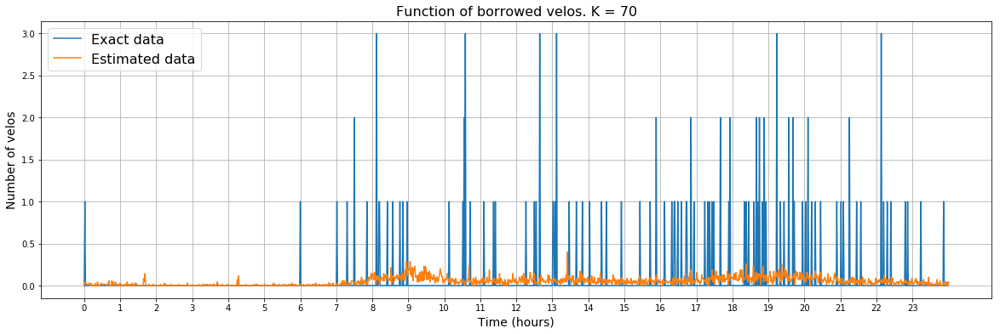

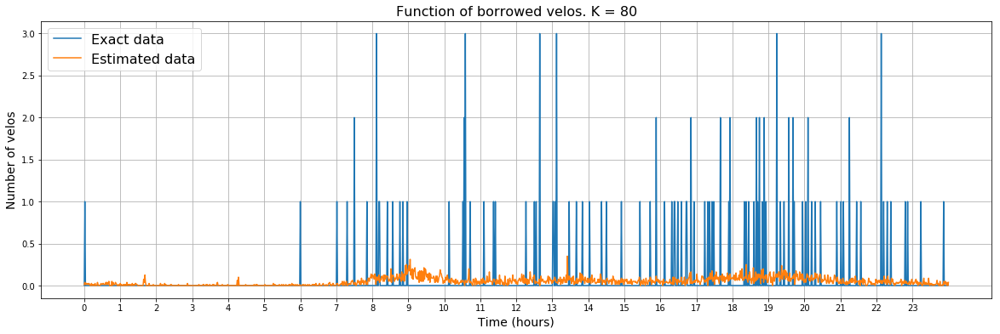

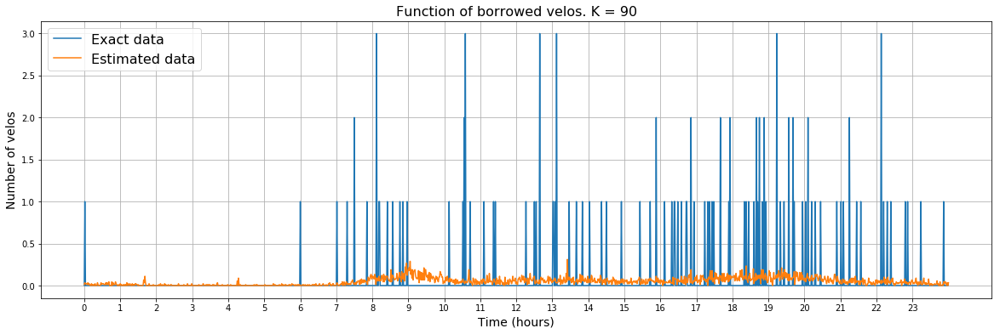

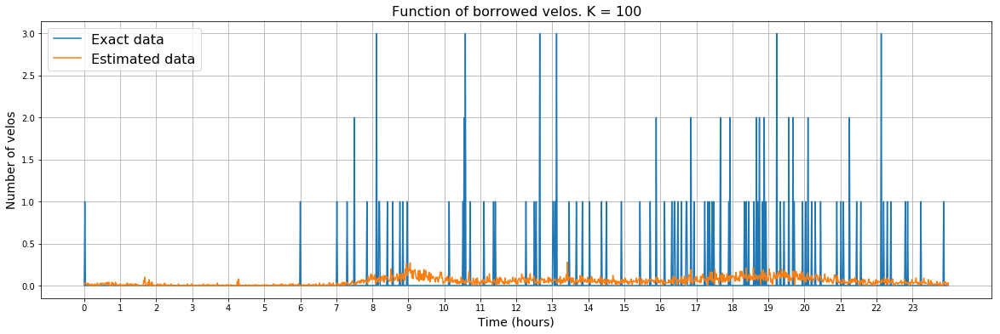

In [41]:
def question32_images(K = np.arange(1,4)):
    for k in K:
        question32(k)

question32_images()
question32_images(np.arange(10,110,10))

``(Une note en anglais)``
Changing the numbers of neighbors just by one leads to the changes in the estimation function. We can observe some gradual evolution. In this method we know how many data is taken into account and we can choose the optimal parameter more precisely than with the Nadaraya-Watson method.